In [1]:
%matplotlib notebook

from copy import deepcopy as copy
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d 
import matplotlib
import numpy as np
from scipy import stats
from scipy.optimize import fsolve
import scipy.io as sio
import pandas as pd
from tqdm import tqdm
import pickle
from collections import OrderedDict
import os
from scipy.ndimage.interpolation import shift
from functools import reduce
import time
from ntwk import LIFNtwkI
from aux import *
from disp import *
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import functools
from functools import partial
from matplotlib import cm
from matplotlib.colors import Normalize
from mpl_toolkits.mplot3d import axes3d

import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning) 

In [2]:
def get_ordered_colors(cmap, n, lb=0, ub=1):
    cmap = cm.get_cmap(cmap)
    return cmap(np.linspace(lb, ub, n))

In [3]:
def fixed_t_d_from_t_b(t_b, params):
    p = params
    return p['tau_e'] * np.log(2 - np.exp(-t_b / p['tau_e']))

def solve_attractor(t_b, params):
    p = params
    exp_t_b = np.exp(-t_b / p['tau_e'])
    return p['w_ee'] / (-1 * p['w_r']) * fixed_t_d_from_t_b(t_b, params) * (1 - exp_t_b) - t_b

In [4]:
def solve_attractor_wrapper(params, guess=20e-3):
    p = params
    f = partial(solve_attractor, params=p)
    sol = fsolve(f, guess, maxfev=10000)
    if len(sol) > 1:
        print(f'{len(sol)} solutions found')
    if np.isclose(f(sol[0]), 0.):
        t_b = sol[0]
        t_d = fixed_t_d_from_t_b(t_b, p)
        return t_b, t_d
    else:
        return np.nan, np.nan

In [5]:
def generate_exp_filter(t, tau):
    return np.exp(-t / tau)

def generate_gaussian_pulse(t, u, s, w=1):
    return w * np.exp(-np.square((t-u) / s))

def simulate(t, n, inp, w=1, w_r_e=0, w_r=0, w_a=0, v_th=1, tau_e=5e-3, tau_i=5e-3, tau_a=10e-3, dt=1e-6, gate=0, g=1, w_u=1, beta=None):    
    inh_activity = np.zeros((len(t),))
    r = np.zeros((len(t), n))
    s = np.zeros((len(t), n))
    v = np.zeros((len(t), n))
    
    inp_r = np.zeros((len(t), n))
    inp_r[:, 0] = inp
    
    def activation(s, v_th, g):
        shifted_s = s - v_th
        shifted_s[shifted_s < 0] = 0
        return g * shifted_s

    w_ff = np.zeros((n, n))
    if beta is None:
        w_ff = np.diag(w * np.ones((n-1)), k=-1)
    else:
        for j in range(n):
            w_ff[j, :j] = w * np.exp((np.arange(j) - j) / beta)
            
    for i in range(0, len(t) - 1):
        inh_activity[i+1] = inh_activity[i] + (np.sum(r[i, :]) - inh_activity[i]) * dt / tau_i
        inh_drive = w_r * np.square(inh_activity[i])
        
        v[i+1, :] = w_u * inp_r[i, :] + np.dot(w_ff, r[i, :].T) + inh_drive
        s[i+1, :] = s[i, :] + (v[i+1, :] - s[i, :]) * dt / tau_e
        r[i+1, :] = activation(s[i, :], v_th, g)
        
    return r, s, inh_activity, v

def shift(x):
    shifted = np.concatenate([[0], copy(x[:-1])])
    return shifted

In [13]:
T = 0.4
dt = 1e-5
t = np.linspace(0, T, int(T / dt))

pulse_widths = np.sqrt(12 * np.linspace(1e-6, 5e-5, 15))
pulse_amps = np.linspace(0, 10e-3, 10)

all_r_in = []

for pw in pulse_widths:
    for pa in pulse_amps:
        all_r_in.append(np.where(np.logical_and(t >= 0, t < pw), pa/pw, 0))

colors = get_ordered_colors('hot', 150)

temp_vars = []
total_activities = []

for i_r, r_in in enumerate(all_r_in):
    r, s, inh_activity, v = simulate(t, 30, r_in, w=1.2e-4 / dt, dt=dt,
                v_th=1.5, w_r=0e-5 / dt * np.ones(60), tau_e=10e-3, tau_i=10e-3)
    
    all_temp_vars = []
    all_total_activities = []
    
    r_in_summed = np.sum(r_in)
    r_in_normed = r_in / r_in_summed

    all_temp_vars.append(np.dot(r_in_normed, np.square(t)) - np.square(np.dot(r_in_normed, t)))
    all_total_activities.append(r_in_summed)
    
    for i in range(r.shape[1]):
        r_summed = np.sum(r[:, i])
        r_normed = r[:, i] / r_summed

        all_temp_vars.append(np.dot(r_normed, np.square(t)) - np.square(np.dot(r_normed, t)))
        all_total_activities.append(r_summed)
    
    temp_vars.append(all_temp_vars)
    total_activities.append(all_total_activities)


KeyboardInterrupt: 

<IPython.core.display.Javascript object>


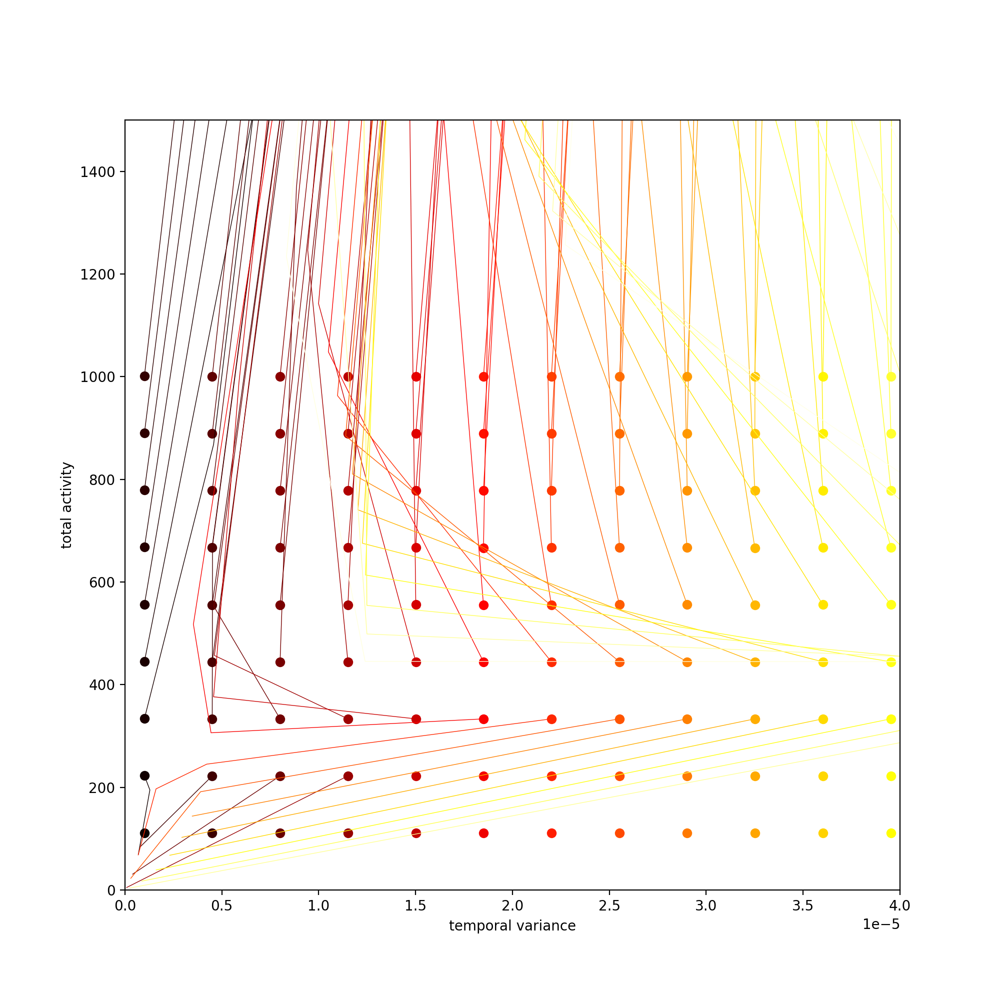

In [10]:
scale = 1
fig, axs = plt.subplots(1, 1, sharex=False, sharey=False, figsize=(10 * scale, 10 * scale))

for i_r in range(len(total_activities)):
    axs.plot(temp_vars[i_r], total_activities[i_r], lw=0.5, color=colors[i_r])
    axs.scatter(temp_vars[i_r][0], total_activities[i_r][0], color=colors[i_r])
    axs.set_ylabel('total activity')
    axs.set_xlabel('temporal variance')
    axs.set_ylim(0, 1500)
    axs.set_xlim(0, 4e-5)

In [16]:
T = 0.4
dt = 1e-5
t = np.linspace(0, T, int(T / dt))

pulse_widths = np.sqrt(12 * np.linspace(1e-6, 5e-5, 15))
pulse_amps = np.linspace(0, 30e-3, 20)

all_r_in = []

for pw in pulse_widths:
    for pa in pulse_amps:
        all_r_in.append(np.where(np.logical_and(t >= 0, t < pw), pa/pw, 0))

temp_vars_1 = []
total_activities_1 = []

for i_r, r_in in enumerate(all_r_in):
    r, s, inh_activity, v = simulate(t, 40, r_in, w=9e-4 / dt, dt=dt,
                v_th=1.2, w_r=-0.4e-5 / dt * np.ones(60), tau_e=10e-3, tau_i=10e-3)
    
    all_temp_vars = []
    all_total_activities = []
    
    r_in_summed = np.sum(r_in)
    r_in_normed = r_in / r_in_summed

    all_temp_vars.append(np.dot(r_in_normed, np.square(t)) - np.square(np.dot(r_in_normed, t)))
    all_total_activities.append(r_in_summed)
    
    for i in range(r.shape[1]):
        r_summed = np.sum(r[:, i])
        r_normed = r[:, i] / r_summed

        all_temp_vars.append(np.dot(r_normed, np.square(t)) - np.square(np.dot(r_normed, t)))
        all_total_activities.append(r_summed)
    
    temp_vars_1.append(all_temp_vars)
    total_activities_1.append(all_total_activities)

In [44]:
def make_phase_flow(temp_vars, total_activities):
    scale = 1
    fig, axs = plt.subplots(1, 1, sharex=False, sharey=False, figsize=(10 * scale, 10 * scale))
    colors = get_ordered_colors('hot', 500)
    final_layer = 39

    zero_count = 0

    for i_r in range(len(total_activities)):
        if i_r % 1 == 0: #and i_r % 40 < 20:
            temp_vars[i_r] = np.array(temp_vars[i_r])
            temp_vars[i_r][np.isnan(temp_vars[i_r])] = 0

            axs.scatter(temp_vars[i_r][final_layer], total_activities[i_r][final_layer], color='#05ff33', zorder=3)

            if temp_vars[i_r][final_layer] < 1e-8 or total_activities[i_r][final_layer] < 1e-8:
                zero_count += 1
                axs.scatter(temp_vars[i_r][0], total_activities[i_r][0], color='blue', zorder=0, s=3)
                axs.plot(temp_vars[i_r][:final_layer + 1], total_activities[i_r][:final_layer + 1], lw=0.5, color='blue', zorder=1)
            else:
                axs.scatter(temp_vars[i_r][0], total_activities[i_r][0], color=colors[i_r], zorder=0, s=3)
                axs.plot(temp_vars[i_r][:final_layer + 1], total_activities[i_r][:final_layer + 1], lw=0.5, color=colors[i_r], zorder=2)

            axs.set_ylabel('total activity')
            axs.set_xlabel('temporal variance')
#             axs.set_ylim(-10, 8000)
#             axs.set_xlim(-1e-6, 6.5e-5)
    
    set_font_size(axs, 20)
    print('zero_count', zero_count)
    print(len(total_activities))

<IPython.core.display.Javascript object>


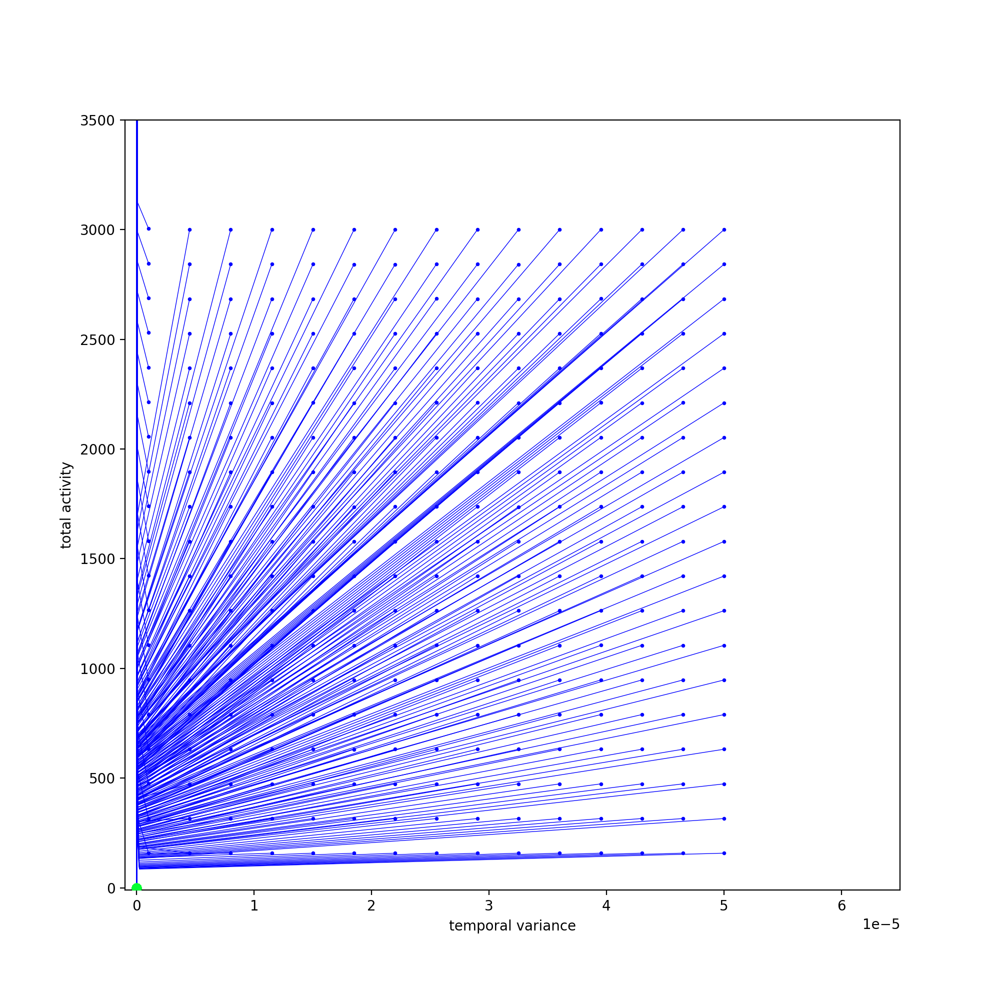

zero_count 300
300


In [18]:
make_phase_flow(temp_vars_1, total_activities_1)

In [50]:
T = 0.4
dt = 1e-5
t = np.linspace(0, T, int(T / dt))

pulse_widths = np.sqrt(12 * np.linspace(1e-6, 10e-5, 5))
pulse_amps = np.linspace(0, 150e-3, 5)

all_r_in = []

for pw in pulse_widths:
    for pa in pulse_amps:
        all_r_in.append(np.where(np.logical_and(t >= 0, t < pw), pa/pw, 0))

temp_vars_2 = []
total_activities_2 = []

for i_r, r_in in enumerate(all_r_in):
    r, s, inh_activity, v = simulate(t, 40, r_in, w=9e-4 / dt, dt=dt,
                v_th=1.2, w_r=-0.4e-5 / dt * np.ones(60), g=2.3e-2, tau_e=10e-3, tau_i=3e-3)
    
    all_temp_vars = []
    all_total_activities = []
    
    r_in_summed = np.sum(r_in)
    r_in_normed = r_in / r_in_summed

    all_temp_vars.append(np.dot(r_in_normed, np.square(t)) - np.square(np.dot(r_in_normed, t)))
    all_total_activities.append(r_in_summed)
    
    for i in range(r.shape[1]):
        r_summed = np.sum(r[:, i])
        r_normed = r[:, i] / r_summed

        all_temp_vars.append(np.dot(r_normed, np.square(t)) - np.square(np.dot(r_normed, t)))
        all_total_activities.append(r_summed)
    
    temp_vars_2.append(all_temp_vars)
    total_activities_2.append(all_total_activities)

In [51]:
make_phase_flow(temp_vars_2, total_activities_2)

<IPython.core.display.Javascript object>

zero_count 5
25


In [52]:
T = 0.4
dt = 1e-5
t = np.linspace(0, T, int(T / dt))

pulse_widths = np.sqrt(12 * np.linspace(1e-6, 10e-5, 5))
pulse_amps = np.linspace(0, 150e-3, 5)

all_r_in = []

for pw in pulse_widths:
    for pa in pulse_amps:
        all_r_in.append(np.where(np.logical_and(t >= 0, t < pw), pa/pw, 0))

temp_vars_3 = []
total_activities_3 = []

for i_r, r_in in enumerate(all_r_in):
    r, s, inh_activity, v = simulate(t, 40, r_in, w=9e-4 / dt, dt=dt,
                v_th=1.2, w_r=-0.4e-5 / dt * np.ones(60), g=2.3e-2, tau_e=10e-3, tau_i=2e-3)
    
    all_temp_vars = []
    all_total_activities = []
    
    r_in_summed = np.sum(r_in)
    r_in_normed = r_in / r_in_summed

    all_temp_vars.append(np.dot(r_in_normed, np.square(t)) - np.square(np.dot(r_in_normed, t)))
    all_total_activities.append(r_in_summed)
    
    for i in range(r.shape[1]):
        r_summed = np.sum(r[:, i])
        r_normed = r[:, i] / r_summed

        all_temp_vars.append(np.dot(r_normed, np.square(t)) - np.square(np.dot(r_normed, t)))
        all_total_activities.append(r_summed)
    
    temp_vars_3.append(all_temp_vars)
    total_activities_3.append(all_total_activities)

KeyboardInterrupt: 

In [ ]:
make_phase_flow(temp_vars_3, total_activities_3)

In [11]:
T = 0.4
dt = 1e-5
t = np.linspace(0, T, int(T / dt))

pulse_widths = np.sqrt(12 * np.linspace(1e-6, 10e-5, 5))
pulse_amps = np.linspace(0, 100e-3, 5)

all_r_in = []

for pw in pulse_widths:
    for pa in pulse_amps:
        all_r_in.append(np.where(np.logical_and(t >= 0, t < pw), pa/pw, 0))

all_runs = []

for r_in in all_r_in:
    res = simulate(t, 40, r_in, w=9e-4 / dt, dt=dt,
                v_th=1.2, w_r=-0.4e-5 / dt * np.ones(60), g=2.3e-2, tau_e=10e-3, tau_i=2e-3)
    all_runs.append(res)

KeyboardInterrupt: 

In [ ]:
scale = 1
fig, axs = plt.subplots(len(all_runs) + 2, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs) + 2) * scale))

layer_colors = get_spaced_colors('summer', 25, 0.03)
run_colors = get_spaced_colors('winter', 25, 0.03)

for r_idx, (r, s, inh_activity, v) in enumerate(all_runs):
    mean_times = []
    total_activities = []
    
#     axs[r_idx].plot(t, 1000 * (inh_activity - np.mean(inh_activity[int(0.1/dt):int(0.3/dt)])) + 6000, '-.', c=layer_colors[l_idx % len(layer_colors)])
    
    for l_idx in range(r.shape[1]):
        if l_idx > 35:
            continue
        if l_idx % 1 == 0:
            axs[r_idx].plot(t, s[:, l_idx], c=layer_colors[l_idx % len(layer_colors)])
#             axs[r_idx].plot(t, 5 * s[:, l_idx], c=layer_colors[l_idx % len(layer_colors)])
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
        
#     axs[r_idx].set_xlim(0.2, 0.3)
    axs[r_idx].set_ylim(0)
    axs[r_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)

    axs[len(all_runs)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs) + 1].scatter(x, np.array(total_activities) / 10**6,  s=3, color=run_colors[r_idx])
    axs[len(all_runs) + 1].plot(x, np.array(total_activities) / 10**6, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs)].set_ylabel('Interlayer Mean\nFiring Time Difference (s)')
axs[len(all_runs)].set_xlabel('Layer')
axs[len(all_runs)].set_ylim(0)
axs[len(all_runs) + 1].set_ylabel('Pulse width (s)')
axs[len(all_runs) + 1].set_xlabel('Layer')

In [26]:
T = 0.6
dt = 0.3e-5
t = np.linspace(0, T, int(T / dt))

r_in = generate_gaussian_pulse(t, 0.01, 0.01, w=2)

all_runs = []


# r_in = np.where(np.logical_and(t > 0, t < 0.01), 2, 0)
res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.4e-5 / dt, tau_e=10e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.3e-2, beta=None)
all_runs.append(res)

# res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
#             v_th=1.2, w_r=-0.4e-5 / dt , tau_e=10e-3, tau_i=2e-3,
#             tau_a=10e-3, gate=0 / dt, g=2.5e-2, beta=None)
# all_runs.append(res)

# res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
#             v_th=1.2, w_r=-0.4e-5 / dt , tau_e=10e-3, tau_i=2e-3,
#             tau_a=10e-3, gate=0 / dt, g=2.7e-2, beta=None)
# all_runs.append(res)

# res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
#             v_th=1.2, w_r=-0.4e-5 / dt , tau_e=10e-3, tau_i=2e-3,
#             tau_a=10e-3, gate=0 / dt, g=2.9e-2, beta=None)
# all_runs.append(res)

# res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
#             v_th=1.2, w_r=-0.4e-5 / dt , tau_e=10e-3, tau_i=2e-3,
#             tau_a=10e-3, gate=0 / dt, g=3.1e-2, beta=None)
# all_runs.append(res)

In [27]:
scale = 1
fig, axs = plt.subplots(len(all_runs) + 2, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs) + 2) * scale))

layer_colors = ['red', 'orange', 'green', 'blue', 'purple']
run_colors = layer_colors

for r_idx, (r, s, inh_activity) in enumerate(all_runs):
    mean_times = []
    total_activities = []
    
    axs[r_idx].plot(t, 1000 * (inh_activity - np.mean(inh_activity[int(0.1/dt):int(0.3/dt)])) + 6000, '-.', c=layer_colors[l_idx % len(layer_colors)])
    
    for l_idx in range(r.shape[1]):
        if l_idx % 1 == 0:
            axs[r_idx].plot(t, 100 * r[:, l_idx], '--', c=layer_colors[l_idx % len(layer_colors)])
            axs[r_idx].plot(t, 5 * s[:, l_idx], c=layer_colors[l_idx % len(layer_colors)])
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
        
    axs[r_idx].set_xlim(0.2, 0.3)
    axs[r_idx].set_ylim(0)
    axs[r_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)

    axs[len(all_runs)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs) + 1].scatter(x, total_activities,  s=3, color=run_colors[r_idx])
    axs[len(all_runs) + 1].plot(x, total_activities, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs)].set_ylabel('Interlayer Mean Spike Time Difference (s)')
axs[len(all_runs)].set_xlabel('Layer')
axs[len(all_runs)].set_ylim(0, 0.012)
axs[len(all_runs) + 1].set_ylabel('Spike Time Var (s)')
axs[len(all_runs) + 1].set_xlabel('Layer')

<IPython.core.display.Javascript object>

ValueError: too many values to unpack (expected 3)

In [49]:
T = 0.6
dt = 0.3e-5
t = np.linspace(0, T, int(T / dt))

r_in = generate_gaussian_pulse(t, 0.01, 0.01, w=2)

all_runs = []


# r_in = np.where(np.logical_and(t > 0, t < 0.01), 2, 0)
res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.4e-5 / dt, tau_e=9e-3, tau_i=2e-3, w_u=10,
            tau_a=10e-3, gate=0 / dt, g=2.3e-2, beta=None)
all_runs.append(res)

res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.4e-5 / dt, tau_e=9e-3, tau_i=2e-3, w_u=100,
            tau_a=10e-3, gate=0 / dt, g=2.3e-2, beta=None)
all_runs.append(res)

res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.4e-5 / dt, tau_e=9e-3, tau_i=2e-3, w_u=1000,
            tau_a=10e-3, gate=0 / dt, g=2.3e-2, beta=None)
all_runs.append(res)

<IPython.core.display.Javascript object>


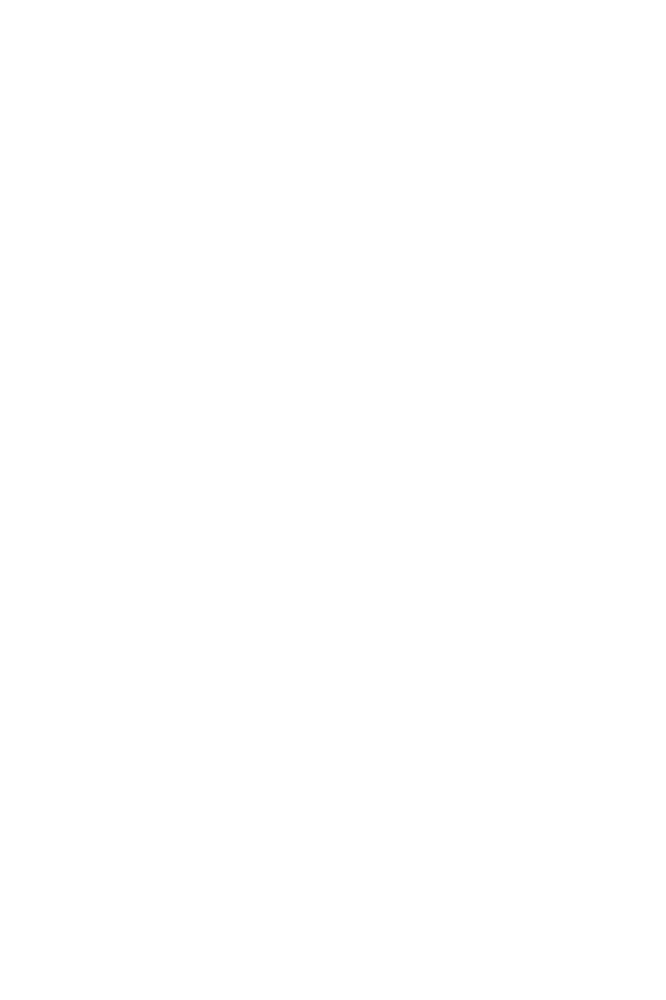

Text(0.5, 0, 'Layer')

In [53]:
scale = 1
fig, axs = plt.subplots(len(all_runs) + 2, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs) + 2) * scale))

layer_colors = ['red', 'orange', 'green', 'blue', 'purple']
run_colors = layer_colors

for r_idx, (r, s, inh_activity, v) in enumerate(all_runs):
    mean_times = []
    total_activities = []
    
    axs[r_idx].plot(t, 1000 * (inh_activity - np.mean(inh_activity[int(0.1/dt):int(0.3/dt)])), '-.', c=layer_colors[l_idx % len(layer_colors)])
    
    for l_idx in range(r.shape[1]):
        if l_idx % 1 == 0:
            axs[r_idx].plot(t, 100 * r[:, l_idx], '--', c=layer_colors[l_idx % len(layer_colors)])
            axs[r_idx].plot(t, v[:, l_idx], c=layer_colors[l_idx % len(layer_colors)])
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
        
    axs[r_idx].set_xlim(0.2, 0.3)
    axs[r_idx].set_ylim(-2000, 10000)
    axs[r_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)

    axs[len(all_runs)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs) + 1].scatter(x, total_activities,  s=3, color=run_colors[r_idx])
    axs[len(all_runs) + 1].plot(x, total_activities, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs)].set_ylabel('Interlayer Mean Spike Time Difference (s)')
axs[len(all_runs)].set_xlabel('Layer')
axs[len(all_runs)].set_ylim(0, 0.012)
axs[len(all_runs) + 1].set_ylabel('Spike Time Var (s)')
axs[len(all_runs) + 1].set_xlabel('Layer')

In [6]:
T = 0.6
dt = 0.3e-5
t = np.linspace(0, T, int(T / dt))
n_layers = 120

r_in = generate_gaussian_pulse(t, 0.01, 0.01, w=2)

all_runs_1A = []

for w in [6e-4, 7e-4, 8e-4, 9e-4, 10e-4, 11e-4]:
    res = simulate(t, n_layers, r_in, w=w / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.4e-5 / dt, tau_e=10e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.3e-2, beta=None, w_u=100)
    all_runs_1A.append(res)

<IPython.core.display.Javascript object>


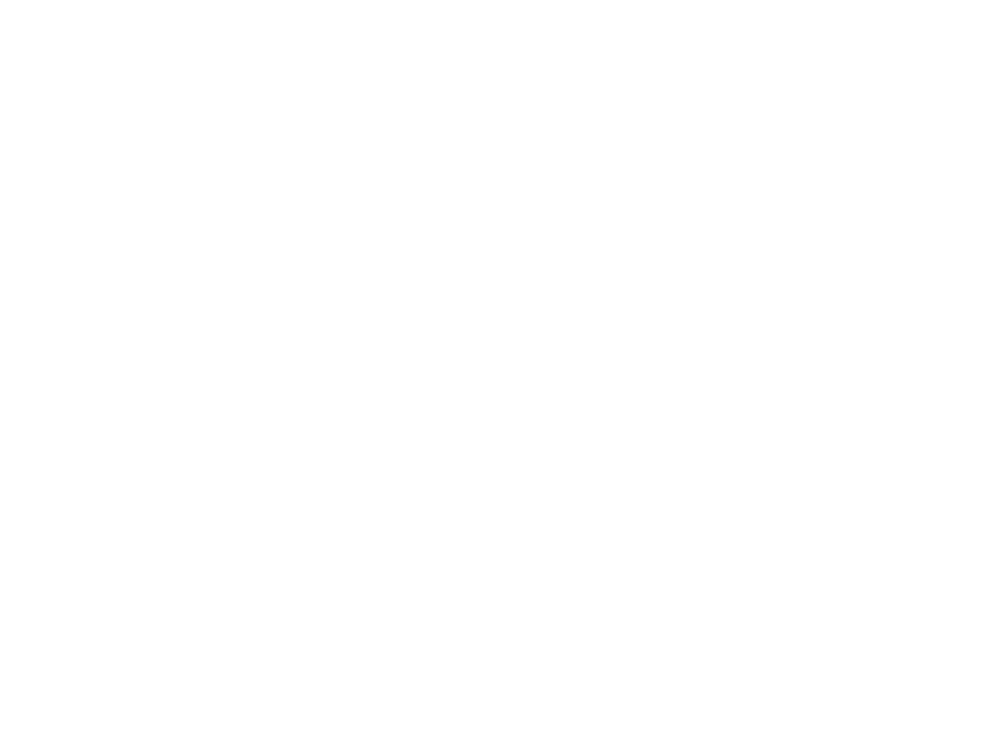

<IPython.core.display.Javascript object>


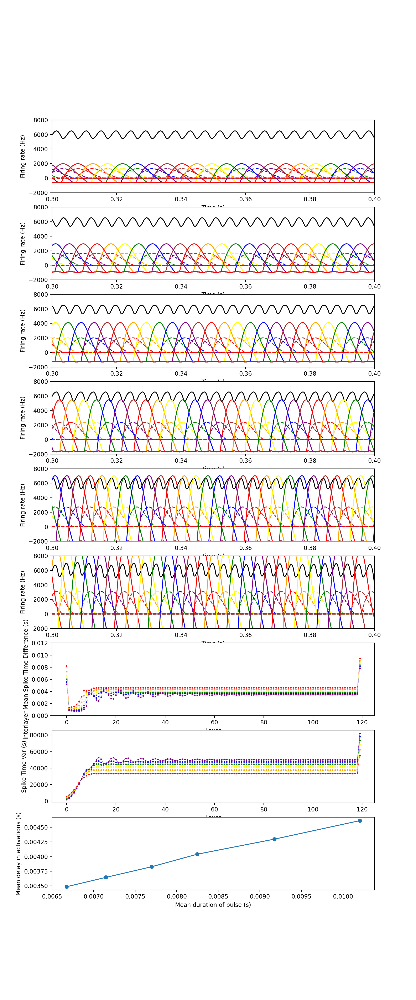

START RUN
START RUN
START RUN
START RUN
START RUN
START RUN


Text(0, 0.5, 'Mean delay in activations (s)')

In [8]:
scale = 1
plt.clf()
fig, axs = plt.subplots(len(all_runs_1A) + 3, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs_1A) + 2) * scale))

layer_colors = ['red', 'orange', 'yellow', 'green', 'blue', 'purple', 'brown']
run_colors = layer_colors

mean_durations_for_runs = []
stable_time_diffs = []

for r_idx, (r, s, inh_activity, v) in enumerate(all_runs_1A):
    mean_times = []
    total_activities = []
    
    axs[r_idx].plot(t, 1000 * (inh_activity - np.mean(inh_activity[int(0.1/dt):int(0.3/dt)])) + 6000, c='black')
    
    print('START RUN')
    all_durations = []
    for l_idx in range(r.shape[1]):
        if l_idx % 1 == 0:
            axs[r_idx].plot(t, 100 * r[:, l_idx], '--', c=layer_colors[l_idx % len(layer_colors)])
            axs[r_idx].plot(t, v[:, l_idx], c=layer_colors[l_idx % len(layer_colors)])
            
            nonzero_v_times = t[(v[:, l_idx] > 0) & (t > 0.2) & (t < 0.35)]
            if len(nonzero_v_times) > 1:
                duration = nonzero_v_times.max() - nonzero_v_times.min()
                all_durations.append(duration)
            
            
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
    
    
    mean_durations_for_runs.append(np.mean(all_durations[1:-1]))
    
    axs[r_idx].set_xlim(0.3, 0.4)
    axs[r_idx].set_ylim(-2000, 8000)
    axs[r_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)
    stable_time_diffs.append(np.mean(time_diffs[80:100]))

    axs[len(all_runs_1A)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs_1A)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs_1A) + 1].scatter(x, total_activities,  s=3, color=run_colors[r_idx])
    axs[len(all_runs_1A) + 1].plot(x, total_activities, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs_1A)].set_ylabel('Interlayer Mean Spike Time Difference (s)')
axs[len(all_runs_1A)].set_xlabel('Layer')
axs[len(all_runs_1A)].set_ylim(0, 0.012)
axs[len(all_runs_1A) + 1].set_ylabel('Spike Time Var (s)')
axs[len(all_runs_1A) + 1].set_xlabel('Layer')

axs[len(all_runs_1A) + 2].plot(mean_durations_for_runs, stable_time_diffs)
axs[len(all_runs_1A) + 2].scatter(mean_durations_for_runs, stable_time_diffs)
axs[len(all_runs_1A) + 2].set_xlabel('Mean duration of pulse (s)')
axs[len(all_runs_1A) + 2].set_ylabel('Mean delay in activations (s)')

In [25]:
T = 0.6
dt = 0.1e-5
t = np.linspace(0, T, int(T / dt))
n_layers = 120

r_in = generate_gaussian_pulse(t, 0.01, 0.01, w=2)

all_runs_1B = []

for w in [6e-4, 7e-4, 8e-4, 9e-4, 10e-4, 11e-4]:
    res = simulate(t, n_layers, r_in, w=w / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.6e-5 / dt * np.ones(n_layers), tau_e=10e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.3e-2, beta=None)
    all_runs_1B.append(res)

In [ ]:
scale = 1
plt.clf()
fig, axs = plt.subplots(len(all_runs_1B) + 3, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs_1B) + 2) * scale))

layer_colors = ['red', 'orange', 'yellow', 'green', 'blue', 'purple', 'brown']
run_colors = layer_colors

mean_durations_for_runs = []
stable_time_diffs = []

for r_idx, (r, s, inh_activity, v) in enumerate(all_runs_1B):
    mean_times = []
    total_activities = []
    
#     axs[r_idx].plot(t, 1000 * (inh_activity - np.mean(inh_activity[int(0.1/dt):int(0.3/dt)])) + 6000, c='black')
    
    print('START RUN')
    all_durations = []
    for l_idx in range(r.shape[1]):
        if l_idx % 1 == 0:
            axs[r_idx].plot(t, 100 * r[:, l_idx], '--', c=layer_colors[l_idx % len(layer_colors)])
            axs[r_idx].plot(t, v[:, l_idx], c=layer_colors[l_idx % len(layer_colors)])
            
            nonzero_v_times = t[(v[:, l_idx] > 0) & (t > 0.3) & (t < 0.4)]
            if len(nonzero_v_times) > 1:
                duration = nonzero_v_times.max() - nonzero_v_times.min()
                all_durations.append(duration)
            
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
    
    print(all_durations[1:-1])
    mean_durations_for_runs.append(np.mean(all_durations[4:-4]))
    
    axs[r_idx].set_xlim(0.3, 0.35)
#     axs[r_idx].set_ylim(-500, 1000)
    axs[r_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)
    stable_time_diffs.append(np.mean(time_diffs[40:60]))

    axs[len(all_runs_1B)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs_1B)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs_1B) + 1].scatter(x, total_activities,  s=3, color=run_colors[r_idx])
    axs[len(all_runs_1B) + 1].plot(x, total_activities, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs_1B)].set_ylabel('Interlayer Mean Spike Time Difference (s)')
axs[len(all_runs_1B)].set_xlabel('Layer')
axs[len(all_runs_1B)].set_ylim(0, 0.012)
axs[len(all_runs_1B) + 1].set_ylabel('Spike Time Var (s)')
axs[len(all_runs_1B) + 1].set_xlabel('Layer')

axs[len(all_runs_1B) + 2].plot(mean_durations_for_runs, stable_time_diffs)
axs[len(all_runs_1B) + 2].scatter(mean_durations_for_runs, stable_time_diffs)
axs[len(all_runs_1B) + 2].set_xlabel('Mean duration of pulse (s)')
axs[len(all_runs_1B) + 2].set_ylabel('Mean delay in activations (s)')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

START RUN
[]
START RUN
[]
START RUN
[]
START RUN
[]
START RUN


In [ ]:
T = 0.6
dt = 0.3e-5
t = np.linspace(0, T, int(T / dt))
n_layers = 120

r_in = generate_gaussian_pulse(t, 0.01, 0.01, w=2)

all_runs = []


# r_in = np.where(np.logical_and(t > 0, t < 0.01), 2, 0)
res = simulate(t, n_layers, r_in, w=8e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.4e-5 / dt * np.ones(n_layers), tau_e=10e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.6e-2, beta=None)
all_runs.append(res)

res = simulate(t, n_layers, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.4e-5 / dt * np.ones(n_layers), tau_e=10e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.6e-2, beta=None)
all_runs.append(res)

res = simulate(t, n_layers, r_in, w=10e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.4e-5 / dt * np.ones(n_layers), tau_e=10e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.6e-2, beta=None)
all_runs.append(res)

In [ ]:
scale = 1
plt.clf()
fig, axs = plt.subplots(len(all_runs) + 3, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs) + 2) * scale))

layer_colors = ['red', 'orange', 'green', 'blue', 'purple']
run_colors = layer_colors

mean_durations_for_runs = []
stable_time_diffs = []

for r_idx, (r, s, inh_activity, v) in enumerate(all_runs):
    mean_times = []
    total_activities = []
    
    axs[r_idx].plot(t, 1000 * (inh_activity - np.mean(inh_activity[int(0.1/dt):int(0.3/dt)])) + 6000, c='black')
    
    print('START RUN')
    all_durations = []
    for l_idx in range(r.shape[1]):
        if l_idx % 1 == 0:
            axs[r_idx].plot(t, 100 * r[:, l_idx], '--', c=layer_colors[l_idx % len(layer_colors)])
            axs[r_idx].plot(t, v[:, l_idx], c=layer_colors[l_idx % len(layer_colors)])
            
            nonzero_v_times = t[(v[:, l_idx] > 0) & (t > 0.2) & (t < 0.35)]
            if len(nonzero_v_times) > 1:
                duration = nonzero_v_times.max() - nonzero_v_times.min()
                all_durations.append(duration)
            
            
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
    
    
    mean_durations_for_runs.append(np.mean(all_durations))
    
    axs[r_idx].set_xlim(0.3, 0.32)
    axs[r_idx].set_ylim(-2000, 8000)
    axs[r_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)
    stable_time_diffs.append(np.mean(time_diffs[80:100]))

    axs[len(all_runs)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs) + 1].scatter(x, total_activities,  s=3, color=run_colors[r_idx])
    axs[len(all_runs) + 1].plot(x, total_activities, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs)].set_ylabel('Interlayer Mean Spike Time Difference (s)')
axs[len(all_runs)].set_xlabel('Layer')
axs[len(all_runs)].set_ylim(0, 0.012)
axs[len(all_runs) + 1].set_ylabel('Spike Time Var (s)')
axs[len(all_runs) + 1].set_xlabel('Layer')

axs[len(all_runs) + 2].plot(mean_durations_for_runs, stable_time_diffs)
axs[len(all_runs) + 2].set_xlabel('Mean duration of pulse (s)')
axs[len(all_runs) + 2].set_ylabel('Mean delay in activations (s)')


In [138]:
T = 0.6
dt = 0.3e-5
t = np.linspace(0, T, int(T / dt))

r_in = generate_gaussian_pulse(t, 0.01, 0.01, w=2)

all_runs = []


# r_in = np.where(np.logical_and(t > 0, t < 0.01), 2, 0)
res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.4e-5 / dt * np.ones(80), tau_e=10e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.3e-2, beta=None)
all_runs.append(res)

res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.5e-5 / dt * np.ones(80), tau_e=10e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.3e-2, beta=None)
all_runs.append(res)

res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.6e-5 / dt * np.ones(80), tau_e=10e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.3e-2, beta=None)
all_runs.append(res)

<IPython.core.display.Javascript object>


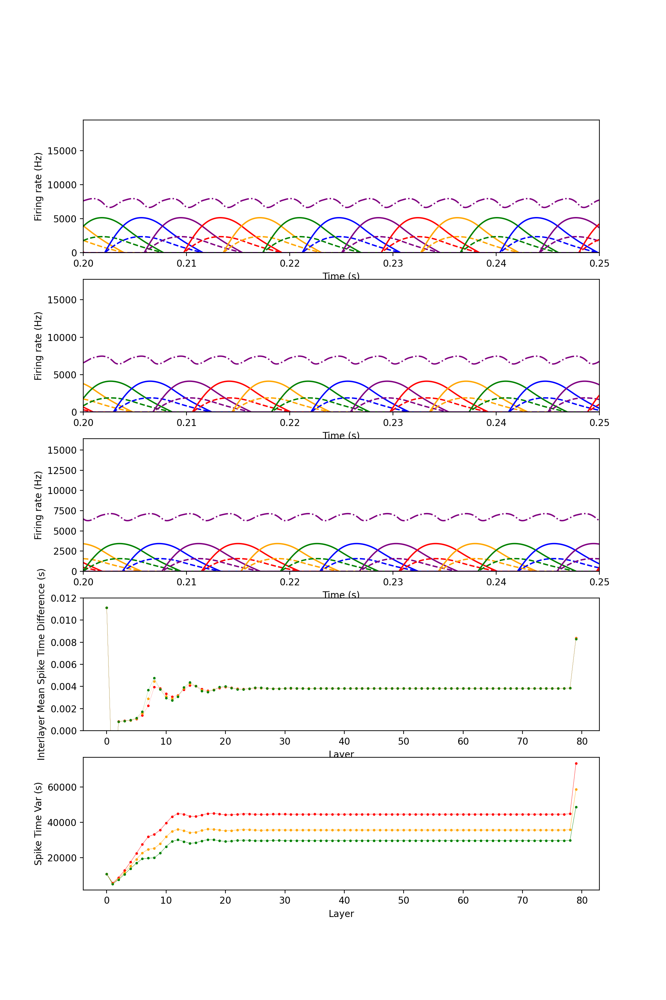

Text(0.5, 0, 'Layer')

In [140]:
scale = 1
fig, axs = plt.subplots(len(all_runs) + 2, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs) + 2) * scale))

layer_colors = ['red', 'orange', 'green', 'blue', 'purple']
run_colors = layer_colors

for r_idx, (r, s, inh_activity) in enumerate(all_runs):
    mean_times = []
    total_activities = []
    
    axs[r_idx].plot(t, 1000 * (inh_activity - np.mean(inh_activity[int(0.1/dt):int(0.3/dt)])) + 6000, '-.', c=layer_colors[l_idx % len(layer_colors)])
    
    for l_idx in range(r.shape[1]):
        if l_idx % 1 == 0:
            axs[r_idx].plot(t, 100 * r[:, l_idx], '--', c=layer_colors[l_idx % len(layer_colors)])
            axs[r_idx].plot(t, 5 * s[:, l_idx], c=layer_colors[l_idx % len(layer_colors)])
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
        
    axs[r_idx].set_xlim(0.2, 0.25)
    axs[r_idx].set_ylim(0)
    axs[r_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)

    axs[len(all_runs)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs) + 1].scatter(x, total_activities,  s=3, color=run_colors[r_idx])
    axs[len(all_runs) + 1].plot(x, total_activities, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs)].set_ylabel('Interlayer Mean Spike Time Difference (s)')
axs[len(all_runs)].set_xlabel('Layer')
axs[len(all_runs)].set_ylim(0, 0.012)
axs[len(all_runs) + 1].set_ylabel('Spike Time Var (s)')
axs[len(all_runs) + 1].set_xlabel('Layer')

In [143]:
T = 0.6
dt = 0.3e-5
t = np.linspace(0, T, int(T / dt))

r_in = generate_gaussian_pulse(t, 0.01, 0.01, w=2)

all_runs = []


# r_in = np.where(np.logical_and(t > 0, t < 0.01), 2, 0)
res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.4e-5 / dt * np.ones(80), tau_e=10e-3, tau_i=1e-3,
            tau_a=10e-3, gate=0 / dt, g=2.3e-2, beta=None)
all_runs.append(res)

res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.4e-5 / dt * np.ones(80), tau_e=10e-3, tau_i=1.5e-3,
            tau_a=10e-3, gate=0 / dt, g=2.3e-2, beta=None)
all_runs.append(res)

res = simulate(t, 80, r_in, w=9e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-0.4e-5 / dt * np.ones(80), tau_e=10e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.3e-2, beta=None)
all_runs.append(res)

<IPython.core.display.Javascript object>


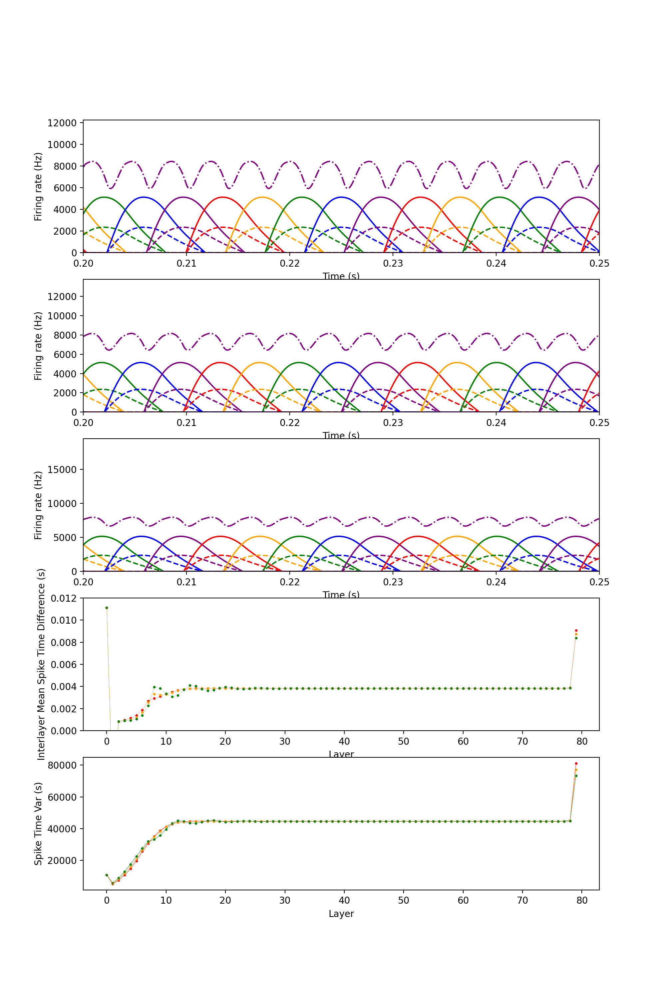

Text(0.5, 0, 'Layer')

In [145]:
scale = 1
fig, axs = plt.subplots(len(all_runs) + 2, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs) + 2) * scale))

layer_colors = ['red', 'orange', 'green', 'blue', 'purple']
run_colors = layer_colors

for r_idx, (r, s, inh_activity) in enumerate(all_runs):
    mean_times = []
    total_activities = []
    
    axs[r_idx].plot(t, 1000 * (inh_activity - np.mean(inh_activity[int(0.1/dt):int(0.3/dt)])) + 6000, '-.', c=layer_colors[l_idx % len(layer_colors)])
    
    for l_idx in range(r.shape[1]):
        if l_idx % 1 == 0:
            axs[r_idx].plot(t, 100 * r[:, l_idx], '--', c=layer_colors[l_idx % len(layer_colors)])
            axs[r_idx].plot(t, 5 * s[:, l_idx], c=layer_colors[l_idx % len(layer_colors)])
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
        
    axs[r_idx].set_xlim(0.2, 0.25)
    axs[r_idx].set_ylim(0)
    axs[r_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)

    axs[len(all_runs)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs) + 1].scatter(x, total_activities,  s=3, color=run_colors[r_idx])
    axs[len(all_runs) + 1].plot(x, total_activities, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs)].set_ylabel('Interlayer Mean Spike Time Difference (s)')
axs[len(all_runs)].set_xlabel('Layer')
axs[len(all_runs)].set_ylim(0, 0.012)
axs[len(all_runs) + 1].set_ylabel('Spike Time Var (s)')
axs[len(all_runs) + 1].set_xlabel('Layer')

In [88]:
T = 0.6
dt = 1e-5
t = np.linspace(0, T, int(T / dt))

# r_in = generate_gaussian_pulse(t, 0.01, 0.002, w=0.5)

all_runs = []

for t_b in np.linspace(0.001, 0.02, 5):
    for amp in np.linspace(0.1, 2, 5):
        r_in = np.where(np.logical_and(t > 0, t < t_b), amp, 0)
        res = simulate(t, 80, r_in, w=11.055e-4 / dt, dt=dt, w_a=0 / dt,
                    v_th=1.2, w_r=-6e-5 / dt * np.ones(80), tau_e=8e-3, tau_i=2e-3,
                    tau_a=10e-3, gate=0 / dt, g=2.5e-2)
        all_runs.append(res)

<IPython.core.display.Javascript object>


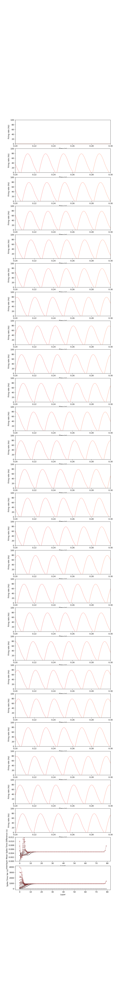

Text(0.5, 0, 'Layer')

In [95]:
scale = .5
fig, axs = plt.subplots(len(all_runs) + 2, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs) + 2) * scale))

layer_colors = get_ordered_colors('hot', 140)
run_colors = layer_colors

for r_idx, (r, s) in enumerate(all_runs):
    mean_times = []
    total_activities = []
    
    for l_idx in range(r.shape[1]):
        if l_idx % 4 == 0:
#             axs[r_idx].plot(t, 100 * r[:, l_idx], c=layer_colors[l_idx])
            axs[r_idx].plot(t, 2 * s[:, l_idx], lw=0.5, c=layer_colors[l_idx])
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
        
    axs[r_idx].set_xlim(.2, .3)
    axs[r_idx].set_ylim(0, 100)
    axs[r_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)

    axs[len(all_runs)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs) + 1].scatter(x, total_activities,  s=3, color=run_colors[r_idx])
    axs[len(all_runs) + 1].plot(x, total_activities, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs)].set_ylabel('Interlayer Mean Spike Time Difference (s)')
axs[len(all_runs)].set_xlabel('Layer')
axs[len(all_runs)].set_ylim(0, 0.012)
axs[len(all_runs) + 1].set_ylabel('Spike Time Var (s)')
axs[len(all_runs) + 1].set_xlabel('Layer')

In [8]:
T = 0.6
dt = 1e-5
t = np.linspace(0, T, int(T / dt))

r_in = np.where(np.logical_and(t > 0, t < 0.005), 1, 0)


all_runs = [
    simulate(t, 80, r_in, w=15.055e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-6e-5 / dt * np.ones(80), tau_e=8e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.7e-2),
    simulate(t, 80, r_in, w=17.055e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-6e-5 / dt * np.ones(80), tau_e=8e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.7e-2),
    simulate(t, 80, r_in, w=19.055e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-6e-5 / dt * np.ones(80), tau_e=8e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.7e-2),
    simulate(t, 80, r_in, w=21.055e-4 / dt, dt=dt, w_a=0 / dt,
        v_th=1.2, w_r=-6e-5 / dt * np.ones(80), tau_e=8e-3, tau_i=2e-3,
        tau_a=10e-3, gate=0 / dt, g=2.7e-2),
    simulate(t, 80, r_in, w=23.055e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-6e-5 / dt * np.ones(80), tau_e=8e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.7e-2),
]

<IPython.core.display.Javascript object>


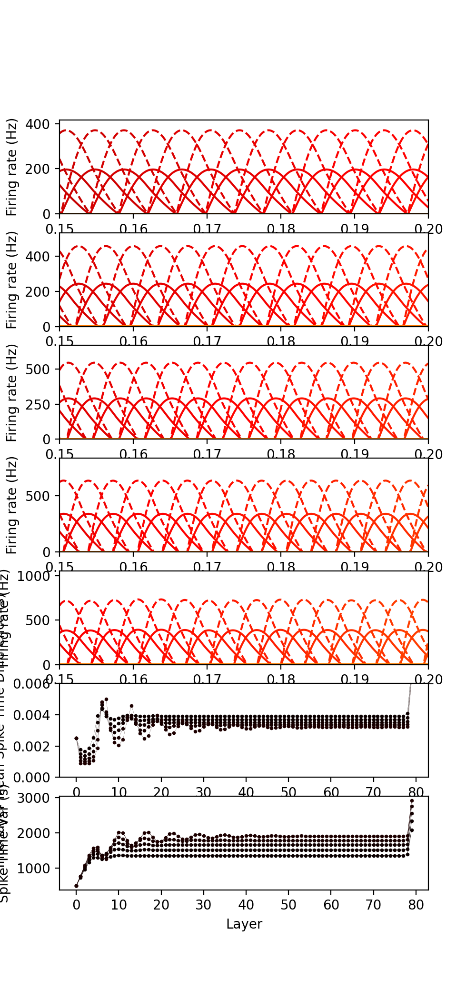

Text(0.5, 0, 'Layer')

In [11]:
scale = .5
fig, axs = plt.subplots(len(all_runs) + 2, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs) + 2) * scale))

layer_colors = get_ordered_colors('hot', 140)
run_colors = layer_colors

for r_idx, (r, s, inh_activity) in enumerate(all_runs):
    mean_times = []
    total_activities = []
    
    for l_idx in range(r.shape[1]):
        if l_idx % 1 == 0:
            axs[r_idx].plot(t, 100 * r[:, l_idx], c=layer_colors[l_idx])
            axs[r_idx].plot(t, 5 * s[:, l_idx], '--', c=layer_colors[l_idx])
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
        
    axs[r_idx].set_xlim(0.15, 0.2)
    axs[r_idx].set_ylim(0)
    axs[r_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)

    axs[len(all_runs)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs) + 1].scatter(x, total_activities,  s=3, color=run_colors[r_idx])
    axs[len(all_runs) + 1].plot(x, total_activities, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs)].set_ylabel('Interlayer Mean Spike Time Difference (s)')
axs[len(all_runs)].set_xlabel('Layer')
axs[len(all_runs)].set_ylim(0, 0.006)
axs[len(all_runs) + 1].set_ylabel('Spike Time Var (s)')
axs[len(all_runs) + 1].set_xlabel('Layer')

In [125]:
T = 0.6
dt = 1e-5
t = np.linspace(0, T, int(T / dt))

r_in = np.where(np.logical_and(t > 0, t < 0.005), 1, 0)


all_runs = [
    simulate(t, 80, r_in, w=15.055e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-6e-5 / dt * np.ones(80), tau_e=8e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.5e-2),
    simulate(t, 80, r_in, w=17.055e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-6e-5 / dt * np.ones(80), tau_e=8e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.6e-2, beta=2),
    simulate(t, 80, r_in, w=19.055e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-6e-5 / dt * np.ones(80), tau_e=8e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.7e-2, beta=2),
    simulate(t, 80, r_in, w=21.055e-4 / dt, dt=dt, w_a=0 / dt,
        v_th=1.2, w_r=-6e-5 / dt * np.ones(80), tau_e=8e-3, tau_i=2e-3,
        tau_a=10e-3, gate=0 / dt, g=2.7e-2),
    simulate(t, 80, r_in, w=23.055e-4 / dt, dt=dt, w_a=0 / dt,
            v_th=1.2, w_r=-6e-5 / dt * np.ones(80), tau_e=8e-3, tau_i=2e-3,
            tau_a=10e-3, gate=0 / dt, g=2.7e-2, beta=2),
]

<IPython.core.display.Javascript object>


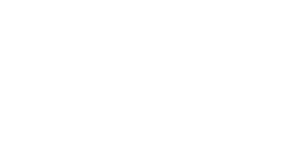

Text(0.5, 0, 'Layer')

In [126]:
scale = .5
fig, axs = plt.subplots(len(all_runs) + 2, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs) + 2) * scale))

layer_colors = get_ordered_colors('hot', 140)
run_colors = layer_colors

for r_idx, (r, s, inh_activity) in enumerate(all_runs):
    mean_times = []
    total_activities = []
    
    for l_idx in range(r.shape[1]):
        if l_idx % 4 == 0:
            axs[r_idx].plot(t, 100 * r[:, l_idx], c=layer_colors[l_idx])
            axs[r_idx].plot(t, 5 * s[:, l_idx], '--', c=layer_colors[l_idx])
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
        
    axs[r_idx].set_xlim(0, T)
    axs[r_idx].set_ylim(0)
    axs[r_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)

    axs[len(all_runs)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs) + 1].scatter(x, total_activities,  s=3, color=run_colors[r_idx])
    axs[len(all_runs) + 1].plot(x, total_activities, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs)].set_ylabel('Interlayer Mean Spike Time Difference (s)')
axs[len(all_runs)].set_xlabel('Layer')
axs[len(all_runs)].set_ylim(0, 0.006)
axs[len(all_runs) + 1].set_ylabel('Spike Time Var (s)')
axs[len(all_runs) + 1].set_xlabel('Layer')

In [49]:
T = 0.32
dt = 1e-5
t = np.linspace(0, T, int(T / dt))

# r_in = generate_gaussian_pulse(t, 0.01, 0.002, w=0.5)

r_in = np.where(np.logical_and(t > 0, t < 0.005), 1, 0)


all_runs = [
    simulate(t, 40, r_in, w=5.055e-4 / dt, dt=dt, w_a=0 / dt,
                v_th=1.2, w_r=0e-5 / dt * np.ones(40), tau_e=10e-3, tau_i=3e-3,
                tau_a=10e-3, gate=0 / dt, g=2.7e-2),
    simulate(t, 40, r_in, w=5.056e-4 / dt, dt=dt, w_a=0 / dt,
                v_th=1.2, w_r=0e-5 / dt * np.ones(40), tau_e=10e-3, tau_i=3e-3,
                tau_a=10e-3, gate=0 / dt, g=2.7e-2),
    simulate(t, 40, r_in, w=5.057e-4 / dt, dt=dt, w_a=0 / dt,
                v_th=1.2, w_r=0e-5 / dt * np.ones(40), tau_e=10e-3, tau_i=3e-3,
                tau_a=10e-3, gate=0 / dt, g=2.7e-2),
]

<IPython.core.display.Javascript object>


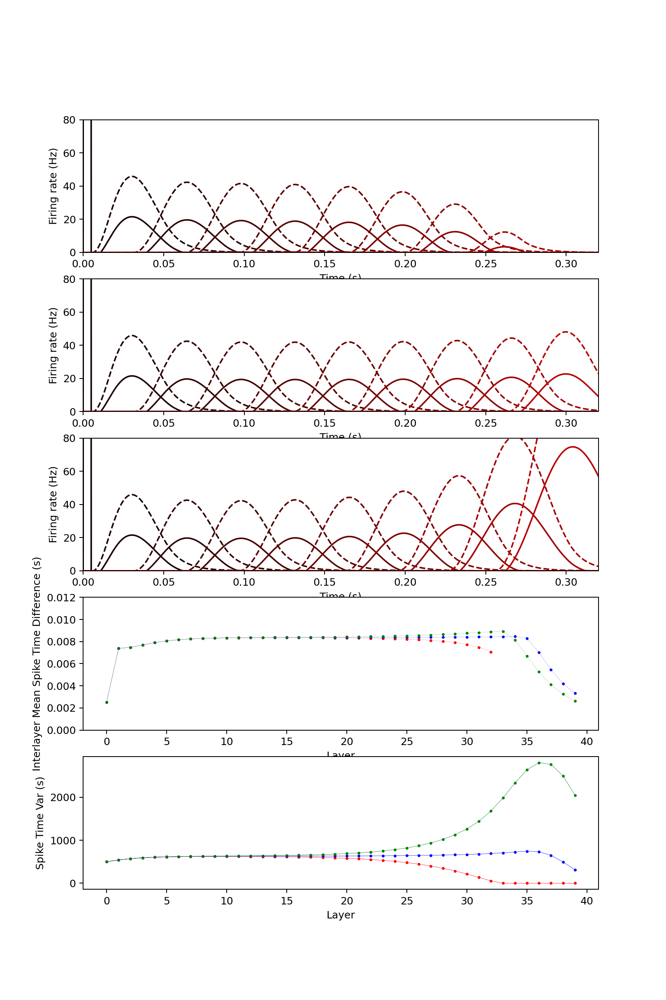

Text(0.5, 0, 'Layer')

In [61]:
scale = .5
fig, axs = plt.subplots(len(all_runs) + 2, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs) + 2) * scale))

layer_colors = get_ordered_colors('hot', 140)
run_colors = ['red', 'blue', 'green', 'purple']

for r_idx, (r, s) in enumerate(all_runs):
    mean_times = []
    total_activities = []
    
    for l_idx in range(r.shape[1]):
        if l_idx % 4 == 0:
            axs[r_idx].plot(t, 100 * r[:, l_idx], c=layer_colors[l_idx])
            axs[r_idx].plot(t, 5 * s[:, l_idx], '--', c=layer_colors[l_idx])
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
        
    axs[r_idx].set_xlim(0, T)
    axs[r_idx].set_ylim(0, 80)
    axsr_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)

    axs[len(all_runs)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs) + 1].scatter(x, total_activities,  s=3, color=run_colors[r_idx])
    axs[len(all_runs) + 1].plot(x, total_activities, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs)].set_ylabel('Interlayer Mean Spike Time Difference (s)')
axs[len(all_runs)].set_xlabel('Layer')
axs[len(all_runs)].set_ylim(0, 0.012)
axs[len(all_runs) + 1].set_ylabel('Spike Time Var (s)')
axs[len(all_runs) + 1].set_xlabel('Layer')

In [17]:
T = 0.32
dt = 1e-5
t = np.linspace(0, T, int(T / dt))

# r_in = generate_gaussian_pulse(t, 0.01, 0.002, w=0.5)

r_in = np.where(np.logical_and(t > 0, t < 0.002), 2.5, 0)


all_runs = [
    simulate(t, 40, r_in, w=4.43e-4 / dt, dt=dt, w_a=0 / dt,
                v_th=1.2, w_r=0e-5 / dt * np.ones(40), tau_e=4e-3, tau_i=3e-3,
                tau_a=10e-3, gate=0 / dt, g=2.7e-2),
    simulate(t, 40, r_in, w=4.44e-4 / dt, dt=dt, w_a=0 / dt,
                v_th=1.2, w_r=0e-5 / dt * np.ones(40), tau_e=4e-3, tau_i=3e-3,
                tau_a=10e-3, gate=0 / dt, g=2.7e-2),
    simulate(t, 40, r_in, w=4.45e-4 / dt, dt=dt, w_a=0 / dt,
                v_th=1.2, w_r=0e-5 / dt * np.ones(40), tau_e=4e-3, tau_i=3e-3,
                tau_a=10e-3, gate=0 / dt, g=2.7e-2),
]

<IPython.core.display.Javascript object>


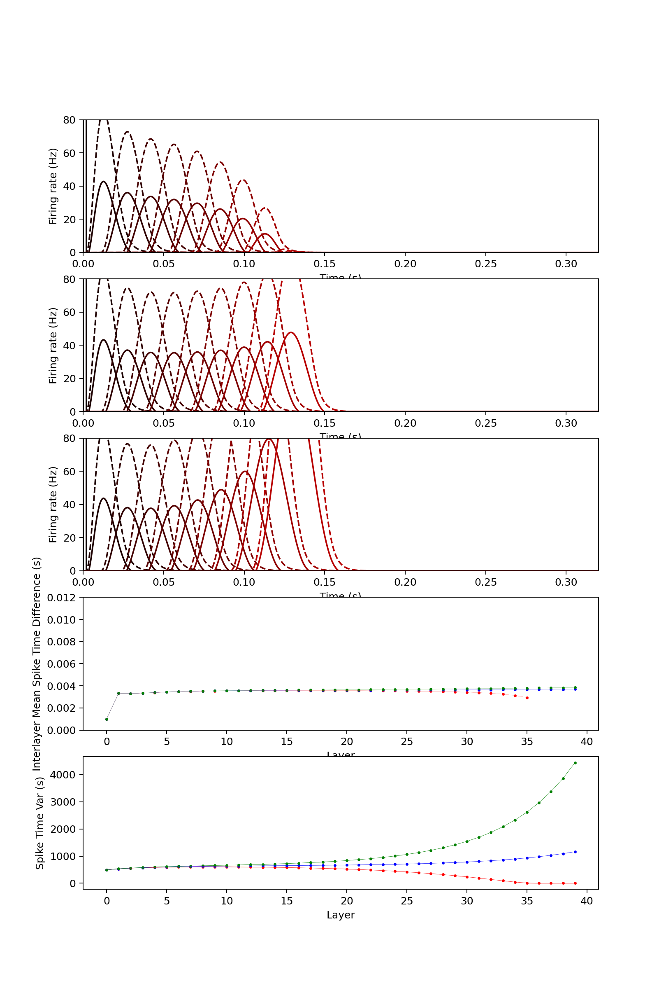

Text(0.5, 0, 'Layer')

In [18]:
scale = .5
fig, axs = plt.subplots(len(all_runs) + 2, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs) + 2) * scale))

layer_colors = get_ordered_colors('hot', 140)
run_colors = ['red', 'blue', 'green', 'purple']

for r_idx, (r, s) in enumerate(all_runs):
    mean_times = []
    total_activities = []
    
    for l_idx in range(r.shape[1]):
        if l_idx % 4 == 0:
            axs[r_idx].plot(t, 100 * r[:, l_idx], c=layer_colors[l_idx])
            axs[r_idx].plot(t, 5 * s[:, l_idx], '--', c=layer_colors[l_idx])
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
        
    axs[r_idx].set_xlim(0, T)
    axs[r_idx].set_ylim(0, 80)
    axs[r_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)

    axs[len(all_runs)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs) + 1].scatter(x, total_activities,  s=3, color=run_colors[r_idx])
    axs[len(all_runs) + 1].plot(x, total_activities, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs)].set_ylabel('Interlayer Mean Spike Time Difference (s)')
axs[len(all_runs)].set_xlabel('Layer')
axs[len(all_runs)].set_ylim(0, 0.012)
axs[len(all_runs) + 1].set_ylabel('Spike Time Var (s)')
axs[len(all_runs) + 1].set_xlabel('Layer')

In [31]:
T = 0.32
dt = 1e-5
t = np.linspace(0, T, int(T / dt))

# r_in = generate_gaussian_pulse(t, 0.01, 0.002, w=0.5)

r_in = np.where(np.logical_and(t > 0, t < 0.01), 0.53, 0)


all_runs = [
    simulate(t, 40, r_in, w=4.43e-4 / dt, dt=dt, w_a=0 / dt,
                v_th=1.2, w_r=0e-5 / dt * np.ones(40), tau_e=4e-3, tau_i=3e-3,
                tau_a=10e-3, gate=0 / dt, g=2.7e-2),
    simulate(t, 40, r_in, w=4.44e-4 / dt, dt=dt, w_a=0 / dt,
                v_th=1.2, w_r=0e-5 / dt * np.ones(40), tau_e=4e-3, tau_i=3e-3,
                tau_a=10e-3, gate=0 / dt, g=2.7e-2),
    simulate(t, 40, r_in, w=4.45e-4 / dt, dt=dt, w_a=0 / dt,
                v_th=1.2, w_r=0e-5 / dt * np.ones(40), tau_e=4e-3, tau_i=3e-3,
                tau_a=10e-3, gate=0 / dt, g=2.7e-2),
]

<IPython.core.display.Javascript object>


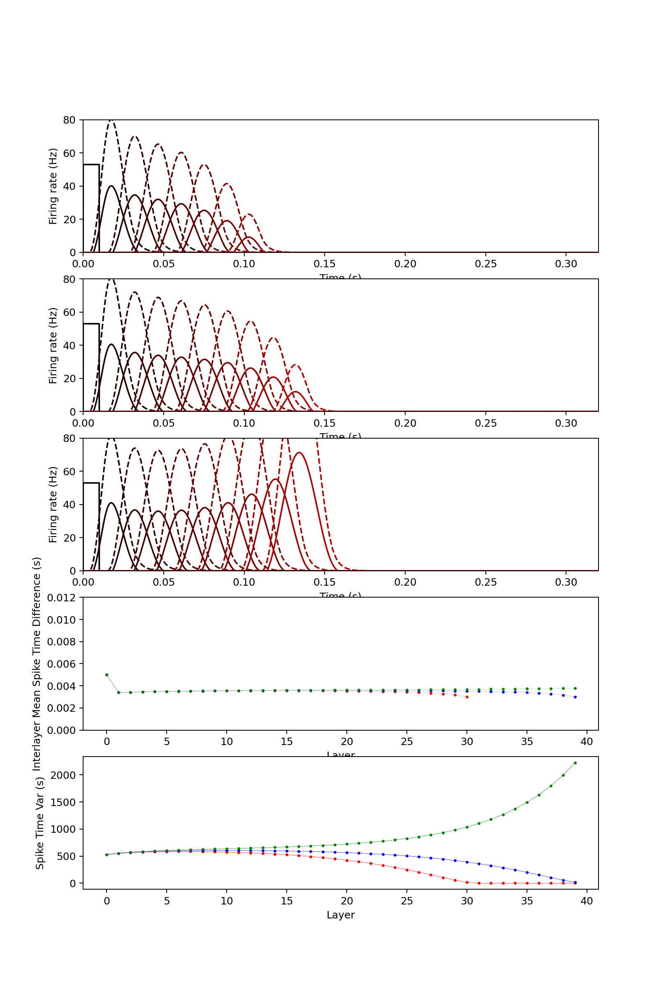

Text(0.5, 0, 'Layer')

In [32]:
scale = .5
fig, axs = plt.subplots(len(all_runs) + 2, 1, sharex=False, sharey=False, figsize=(10 * scale, 3 * (len(all_runs) + 2) * scale))

layer_colors = get_ordered_colors('hot', 140)
run_colors = ['red', 'blue', 'green', 'purple']

for r_idx, (r, s) in enumerate(all_runs):
    mean_times = []
    total_activities = []
    
    for l_idx in range(r.shape[1]):
        if l_idx % 4 == 0:
            axs[r_idx].plot(t, 100 * r[:, l_idx], c=layer_colors[l_idx])
            axs[r_idx].plot(t, 5 * s[:, l_idx], '--', c=layer_colors[l_idx])
        r_summed = np.sum(r[:, l_idx])
        mean_times.append(np.dot(r[:, l_idx], t) / r_summed)
        total_activities.append(r_summed)
        
    axs[r_idx].set_xlim(0, T)
    axs[r_idx].set_ylim(0, 80)
    axs[r_idx].set_xlabel('Time (s)')
    axs[r_idx].set_ylabel('Firing rate (Hz)')
                            
    x = np.arange(len(mean_times))
    time_diffs = mean_times - shift(mean_times)

    axs[len(all_runs)].scatter(x, time_diffs, s=3, color=run_colors[r_idx])
    axs[len(all_runs)].plot(x, time_diffs, lw=0.1, color=run_colors[r_idx])
    axs[len(all_runs) + 1].scatter(x, total_activities,  s=3, color=run_colors[r_idx])
    axs[len(all_runs) + 1].plot(x, total_activities, lw=0.3, color=run_colors[r_idx])
    
axs[len(all_runs)].set_ylabel('Interlayer Mean Spike Time Difference (s)')
axs[len(all_runs)].set_xlabel('Layer')
axs[len(all_runs)].set_ylim(0, 0.012)
axs[len(all_runs) + 1].set_ylabel('Spike Time Var (s)')
axs[len(all_runs) + 1].set_xlabel('Layer')